<a href="https://colab.research.google.com/github/jananialagar4/CNN_Classification_of_subImages_using_-ARUCOmarkers/blob/main/Classification_of_sub_images_(5_subgroups)_using_Aruco_Markers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

trying to add text

Error:  [Errno 2] No such file or directory: './input'
x,y,w,h
220 1284 312 1373
<class 'list'>
<class 'numpy.ndarray'>


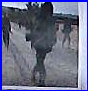

<class 'numpy.ndarray'>


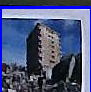

<class 'numpy.ndarray'>


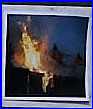

<class 'numpy.ndarray'>


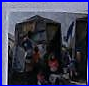

<class 'numpy.ndarray'>


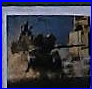

EVent list
(243, 538, 331, 629)
EVent list
(218, 876, 309, 968)
EVent list
(715, 881, 808, 990)
EVent list
(699, 1089, 788, 1175)
EVent list
(220, 1284, 312, 1373)
img
<class 'numpy.ndarray'>


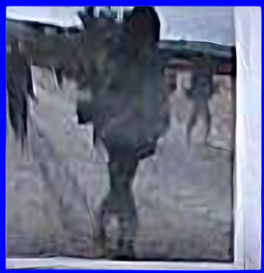

(1, 224, 224, 3)
1/1 [==============================] - 3s 3s/step
1 combat
bbox 243 538 331 629
text in image


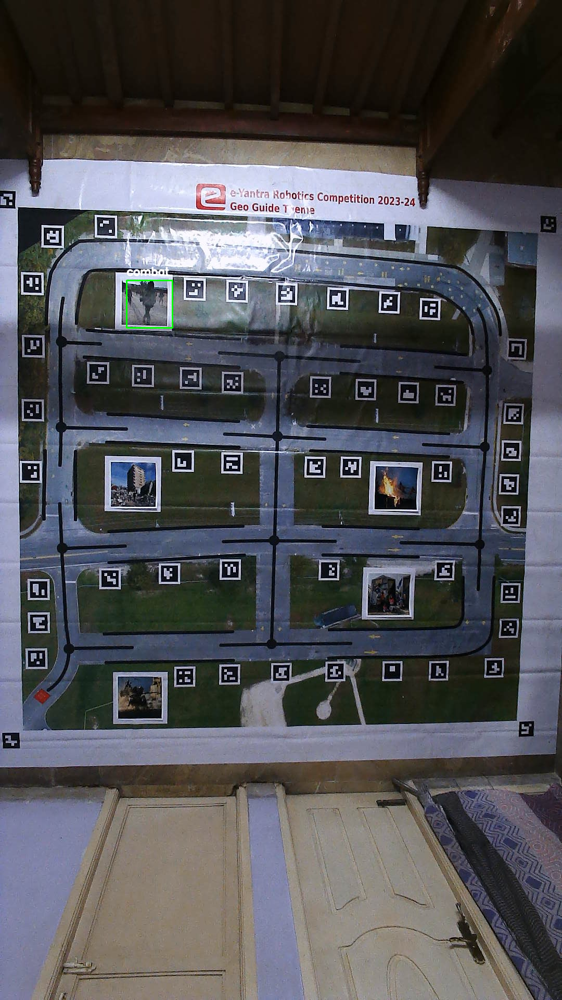

img
<class 'numpy.ndarray'>


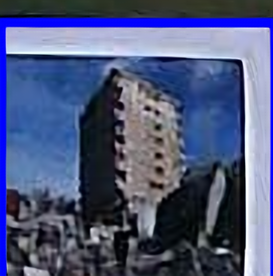

(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
2 destroyedbuilding
bbox 243 538 331 629
bbox 218 876 309 968
text in image


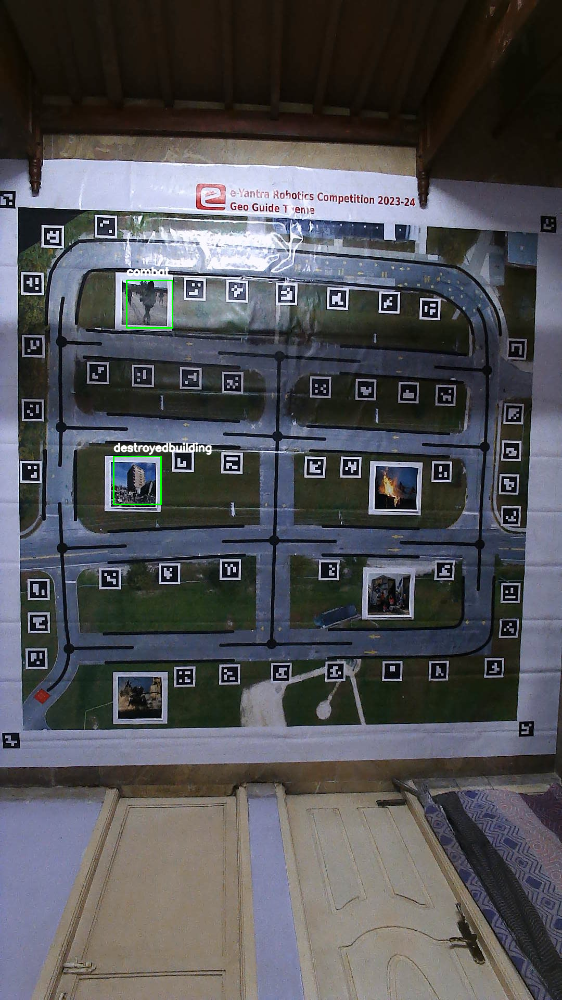

img
<class 'numpy.ndarray'>


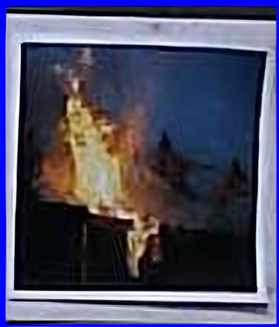

(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
3 fire
bbox 243 538 331 629
bbox 218 876 309 968
bbox 715 881 808 990
text in image


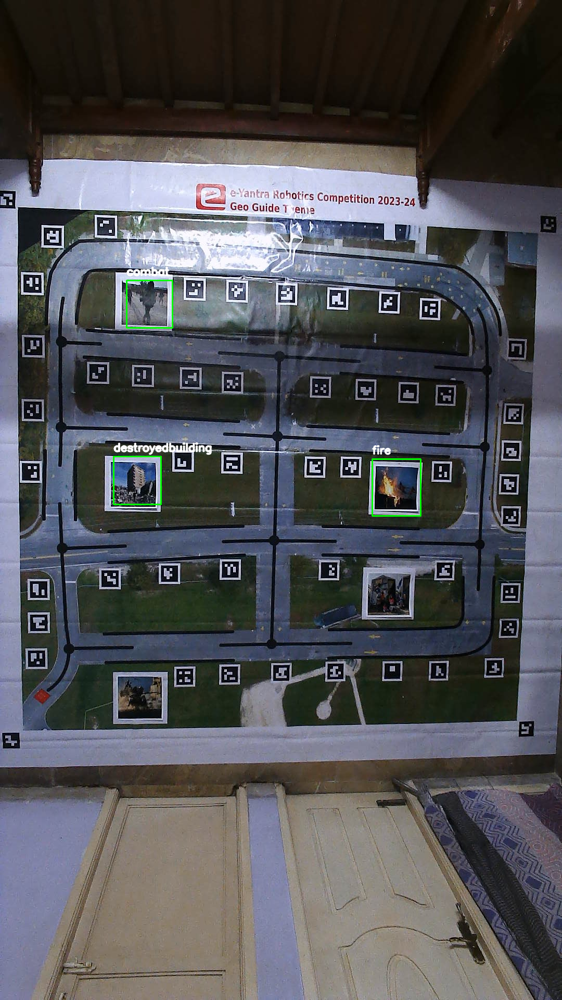

img
<class 'numpy.ndarray'>


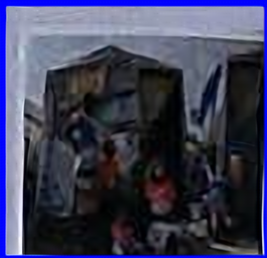

(1, 224, 224, 3)
1/1 [==============================] - 3s 3s/step
4 destroyedbuilding
bbox 243 538 331 629
bbox 218 876 309 968
bbox 715 881 808 990
bbox 699 1089 788 1175
text in image


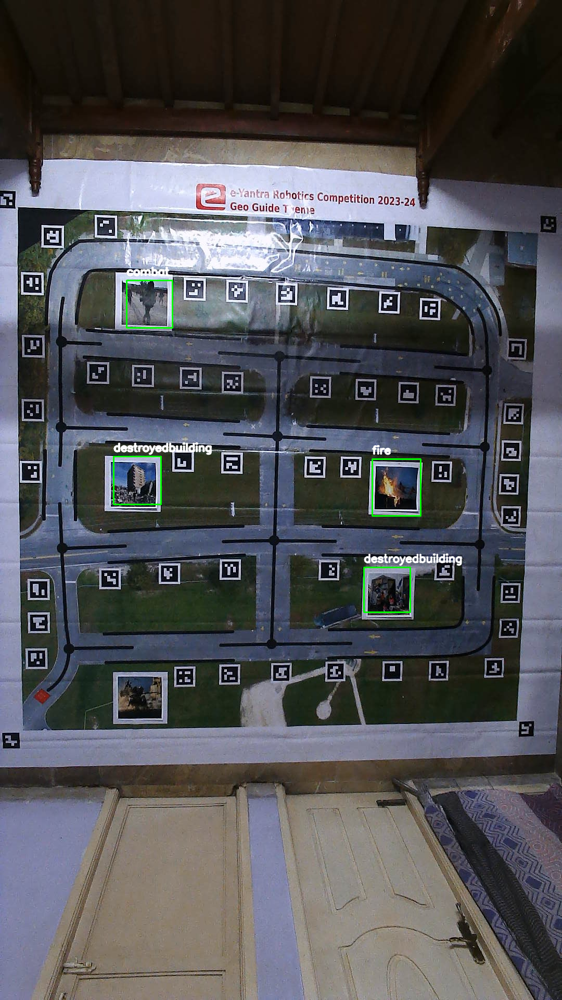

img
<class 'numpy.ndarray'>


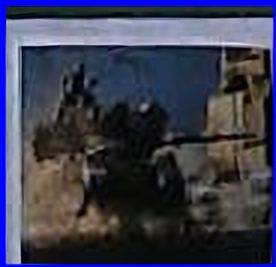

(1, 224, 224, 3)


1/1 [==============================] - 2s 2s/step
5 combat
bbox 243 538 331 629
bbox 218 876 309 968
bbox 715 881 808 990
bbox 699 1089 788 1175
bbox 220 1284 312 1373
text in image


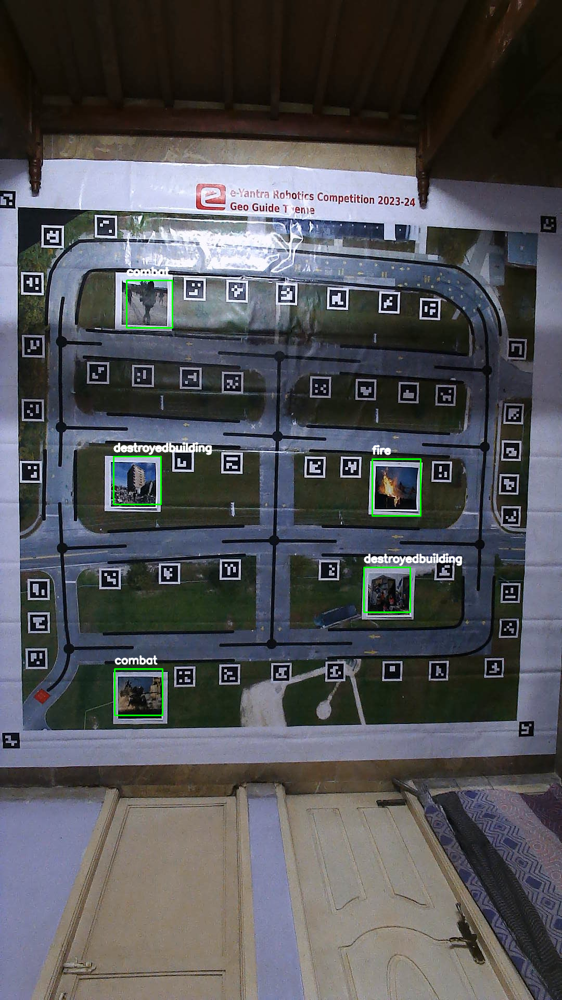

FileNotFoundError: [Errno 2] No such file or directory: 'arena.png'

In [ ]:
# @title bbox,classify,text,nolive
from sys import platform
import numpy as np
import subprocess
import cv2 as cv       # OpenCV Library
import shutil
import ast
import sys
import os
from cv2 import aruco
import cv2
from google.colab.patches import cv2_imshow

from tensorflow.keras.models import load_model
from PIL import Image
import cv2
from tensorflow import keras
from tensorflow.keras.preprocessing import image

arena_path = "testd1.jpg"            # Path of generated arena image
event_list = []
detected_list = []

combat = "combat"
rehab = "humanitarianaid"
military_vehicles = "militaryvehicles"
fire = "fire"
destroyed_building = "destroyedbuilding"

def arena_image(arena_path):
  frame = cv.imread(arena_path)
  #arena = cv.resize(frame, (700,700))
  arena = frame
  return arena


def event_identification(arena):
      bboxes = []
      def process_image1(image_path, marker_dict, param_markers, target_marker_id, min_area, max_area, scale_factor_width, scale_factor_height, align_width_to_left=True, extra_distance=2):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
            gray_frame, marker_dict, parameters=param_markers
            )

            # Initialize marker_corners as an empty list
            marker_corners_list = []

            # Check if any markers are found
            if marker_corners:
                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID
                    if ids[0] == target_marker_id:
                        marker_corners_list.append(corners)

                # Check if the ArUco marker is found
                if marker_corners_list:
                    # Combine corners of all markers to get the common region
                    common_region = np.concatenate(marker_corners_list, axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor
                    new_w = int(w * scale_factor_width1)

                    # Adjust the x-coordinate based on the alignment option and extra distance
                    if align_width_to_left1:
                        new_x = x - extra_distance1 - (new_w - w)  # Align to the left side with extra distance
                    else:
                        new_x = x  # Align to the right side without extra distance

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height1)

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, y), (new_x + new_w, y + new_h), (255, 0, 0), 2)

                    # Crop the region based on the modified bounding box
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area1 <= cv.contourArea(cnt) <= max_area1
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,y,new_x+new_w,y+new_h

                cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()

      def process_image2(image_path, marker_dict, param_markers, target_marker_id, min_area, max_area, scale_factor_width, scale_factor_height, align_width_to_left=True,align_width_to_top=True, extra_distance=2):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            # Initialize marker_corners as an empty list
            marker_corners_list = []

            # Check if any markers are found
            if marker_corners:
                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID
                    if ids[0] == target_marker_id:
                        marker_corners_list.append(corners)

                # Check if the ArUco marker is found
                if marker_corners_list:
                    # Combine corners of all markers to get the common region
                    common_region = np.concatenate(marker_corners_list, axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor
                    new_w = int(w * scale_factor_width2)

                    # Adjust the x-coordinate based on the alignment option and extra distance
                    if align_width_to_left2:
                        new_x = x - extra_distance2 - (new_w - w)  # Align to the left side with extra distance
                    else:
                        new_x = x  # Align to the right side without extra distance

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height2)

                    if align_width_to_top2:
                        new_y = y - 52 + (new_h - h)   # Align to the left side with extra distance
                    else:
                        new_y = y  # Align to the right side without extra distance

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, new_y), (new_x + new_w, new_y + new_h), (255, 0, 0), 2)

                    # Crop the region based on the modified bounding box
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area2 <= cv.contourArea(cnt) <= max_area2
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,new_y,new_x + new_w,new_y + new_h

                cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()

      def process_image3(image_path, marker_dict, param_markers, target_marker_id_1, target_marker_id_2, min_area, max_area, scale_factor_width, scale_factor_height):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            if marker_corners:
                # Lists to store corners of the specified ArUco markers
                corners_1 = None
                corners_2 = None

                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID 1
                    if ids[0] == target_marker_id_31:
                        corners_1 = corners

                    # Check if the current marker ID matches the target ID 2
                    elif ids[0] == target_marker_id_32:
                        corners_2 = corners

                # Check if both ArUco markers are found
                if corners_1 is not None and corners_2 is not None:
                    # Combine corners of both markers to get the common region
                    common_region = np.concatenate((corners_1, corners_2), axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    #cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor from the center
                    new_w = int(w * scale_factor_width3)

                    # Adjust the x-coordinate to keep the center of the bounding box fixed
                    new_x = int(x + (w - new_w) / 2)

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height3)

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, y), (new_x + new_w, y + new_h), (255, 0, 0), 2)

                    # Crop the common region
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area3 <= cv.contourArea(cnt) <= max_area3
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,y,new_x+new_w,y+new_h

                cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()

      def process_image4(image_path, marker_dict, param_markers, target_marker_id_1, target_marker_id_2, min_area, max_area, scale_factor_width, scale_factor_height):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            if marker_corners:
                # Lists to store corners of the specified ArUco markers
                corners_1 = None
                corners_2 = None

                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID 1
                    if ids[0] == target_marker_id_41:
                        corners_1 = corners

                    # Check if the current marker ID matches the target ID 2
                    elif ids[0] == target_marker_id_42:
                        corners_2 = corners

                # Check if both ArUco markers are found
                if corners_1 is not None and corners_2 is not None:
                    # Combine corners of both markers to get the common region
                    common_region = np.concatenate((corners_1, corners_2), axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    #cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor from the center
                    new_w = int(w * scale_factor_width4)

                    # Adjust the x-coordinate to keep the center of the bounding box fixed
                    new_x = int(x + (w - new_w) / 2)

                    # Calculate the new height based on scaling factor from the top side
                    extra_distance = 10  # Set the extra distance from the top side
                    new_h = int(h * scale_factor_height4)
                    new_y = y + extra_distance  # Adjust the y-coordinate to align with the top side

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, new_y), (new_x + new_w, new_y + new_h), (255, 0, 0), 2)

                    # Crop the common region
                    roi = frame[new_y:new_y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area4 <= cv.contourArea(cnt) <= max_area4
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,new_y,new_x + new_w,new_y + new_h

                cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()

      def process_image5(image_path, marker_dict, param_markers, target_marker_id, min_area, max_area, scale_factor_width, scale_factor_height, align_width_to_left=True, extra_distance=2):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            # Initialize marker_corners as an empty list
            marker_corners_list = []

            # Check if any markers are found
            if marker_corners:
                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID
                    if ids[0] == target_marker_id:
                        marker_corners_list.append(corners)

                # Check if the ArUco marker is found
                if marker_corners_list:
                    # Combine corners of all markers to get the common region
                    common_region = np.concatenate(marker_corners_list, axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor
                    new_w = int(w * scale_factor_width5)

                    # Adjust the x-coordinate based on the alignment option and extra distance
                    if align_width_to_left5:
                        new_x = x - extra_distance5 - (new_w - w)  # Align to the left side with extra distance
                    else:
                        new_x = x  # Align to the right side without extra distance

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height5)

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, y), (new_x + new_w, y + new_h), (255, 0, 0), 2)

                    print("x,y,w,h")
                    print(new_x, y, new_x+new_w, y+new_h)

                    # Crop the region based on the modified bounding box
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area5 <= cv.contourArea(cnt) <= max_area5
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,y,new_x + new_w,y + new_h

                cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()

      marker_dict = cv.aruco.getPredefinedDictionary(aruco.DICT_4X4_100)
      param_markers = aruco.DetectorParameters()

      image_path = 'testd1.jpg'

      target_marker_id_1 = 48  # Set the desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area1 = 3000  # Set the minimum area threshold for the white box
      max_area1 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width1 = 2.6  # Set the scaling factor for the width of the bounding box
      scale_factor_height1 = 2.6  # Set the scaling factor for the height of the bounding box (from top)
      align_width_to_left1 = True  # Set to True if you want to align the width to the left side
      extra_distance1 = 60  # Set the extra distance for alignment

      target_marker_id_2 = 34  # Set the desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area2 = 3000  # Set the minimum area threshold for the white box
      max_area2 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width2 = 2.7  # Set the scaling factor for the width of the bounding box
      scale_factor_height2 = 2.8  # Set the scaling factor for the height of the bounding box (from top)
      align_width_to_left2 = True  # Set to True if you want to align the width to the left side
      align_width_to_top2 = True
      extra_distance2 = 60  # Set the extra distance for alignment

      target_marker_id_31 = 31  # Set the first desired ArUco marker ID
      target_marker_id_32 = 30  # Set the second desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area3 = 3000  # Set the minimum area threshold for the white box
      max_area3 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width3 = 0.45  # Set the scaling factor for the width of the bounding box (from center)
      scale_factor_height3 = 2.67

      target_marker_id_41 = 28  # Set the first desired ArUco marker ID
      target_marker_id_42 = 29  # Set the second desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area4 = 3000  # Set the minimum area threshold for the white box
      max_area4 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width4 = 0.35  # Set the scaling factor for the width of the bounding box (from center)
      scale_factor_height4 = 2.7

      target_marker_id_5 = 21  # Set the desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area5 = 3000  # Set the minimum area threshold for the white box
      max_area5 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width5 = 2.8  # Set the scaling factor for the width of the bounding box
      scale_factor_height5 = 2.8  # Set the scaling factor for the height of the bounding box (from top)
      align_width_to_left5 = True  # Set to True if you want to align the width to the left side
      extra_distance5 = 60

      r1 = (process_image1(image_path, marker_dict, param_markers, target_marker_id_1, min_area1, max_area1, scale_factor_width1, scale_factor_height1, align_width_to_left1, extra_distance1))
      r2 = (process_image2(image_path, marker_dict, param_markers, target_marker_id_2, min_area2, max_area2, scale_factor_width2, scale_factor_height2, align_width_to_left2, align_width_to_top2, extra_distance2))
      r3 = (process_image3(image_path, marker_dict, param_markers, target_marker_id_31, target_marker_id_32, min_area3, max_area3, scale_factor_width3, scale_factor_height3))
      r4 = (process_image4(image_path, marker_dict, param_markers, target_marker_id_41, target_marker_id_42, min_area4, max_area4, scale_factor_width4, scale_factor_height4))
      r5 = (process_image5(image_path, marker_dict, param_markers, target_marker_id_5, min_area5, max_area5, scale_factor_width5, scale_factor_height5, align_width_to_left5, extra_distance5))

      if r1 is not None:
        bboxes.append(r1[0])
      if r2 is not None:
        bboxes.append(r2[0])
      if r3 is not None:
        bboxes.append(r3[0])
      if r4 is not None:
        bboxes.append(r4[0])
      if r5 is not None:
        bboxes.append(r5[0])

      evlist = []

      if r1 is not None:
        evlist.append(r1[1:])
      if r2 is not None:
        evlist.append(r2[1:])
      if r3 is not None:
        evlist.append(r3[1:])
      if r4 is not None:
        evlist.append(r4[1:])
      if r5 is not None:
        evlist.append(r5[1:])


      '''evlist.append(process_image1(image_path, marker_dict, param_markers, target_marker_id_1, min_area1, max_area1, scale_factor_width1, scale_factor_height1, align_width_to_left1, extra_distance1))[0]
      evlist.append(process_image2(image_path, marker_dict, param_markers, target_marker_id_2, min_area2, max_area2, scale_factor_width2, scale_factor_height2, align_width_to_left2, align_width_to_top2, extra_distance2))[0]
      evlist.append(process_image3(image_path, marker_dict, param_markers, target_marker_id_31, target_marker_id_32, min_area3, max_area3, scale_factor_width3, scale_factor_height3))[0]
      evlist.append(process_image4(image_path, marker_dict, param_markers, target_marker_id_41, target_marker_id_42, min_area4, max_area4, scale_factor_width4, scale_factor_height4))[0]
      evlist.append(process_image5(image_path, marker_dict, param_markers, target_marker_id_5, min_area5, max_area5, scale_factor_width5, scale_factor_height5, align_width_to_left5, extra_distance5))[0]
      '''

      print(type(bboxes))
      for i in bboxes:
        print(type(i))
        #print(i)
        cv2_imshow(i)
      event_list = bboxes
      for i in evlist:
        print("EVent list")
        print(i)

      return event_list,evlist


def classify_event(image_path):
    from cv2 import dnn_superres

    # Create an SR object
    sr = dnn_superres.DnnSuperResImpl_create()

    # Read image
    image = image_path
    image = np.array(image)

    # Read the desired model
    path = "/content/drive/MyDrive/EDSR_x3.pb"
    sr.readModel(path)

    # Set the desired model and scale to get correct pre- and post-processing
    sr.setModel("edsr", 3)

    # Upscale the image
    result = sr.upsample(image)

    cv2_imshow(result)





    model = keras.models.load_model('detector.h5')
    # img_path = image
    # img = image.load_img(img_path, target_size=(height, width))  # height and width should match your model's input shape
    #img = image_path
    img = result
    #img_array = cv2.imread(img)
    img_array = np.array(img)
    resized_image = cv2.resize(img_array, (224, 224))
    img_array = np.expand_dims(resized_image, axis=0)

    print(img_array.shape)
    img_array = img_array / 255.0  # Normalize the pixel values
    #print(img_array)

    predictions = model.predict(img_array)
    predicted_label = np.argmax(predictions)
    a = [combat, destroyed_building, fire, rehab, military_vehicles]
    b = a[predicted_label]
    event = b

    return event
def draw_text(image, text, x, y):
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.7
    font_thickness = 2
    color = (255, 255, 255)
    cv2.putText(image, text, (x, y - 10), font, font_scale, color, font_thickness, cv2.LINE_AA)

def classification(event_list,evlist):
    arena = cv.imread(arena_path)
    for img_index in range(0,5):
        img = event_list[img_index]
        print("img")
        print(type(img))
        detected_event = classify_event(img)
        print((img_index + 1), detected_event)
        if detected_event == combat:
            detected_list.append("combat")
        if detected_event == rehab:
            detected_list.append("rehab")
        if detected_event == military_vehicles:
            detected_list.append("militaryvehicles")
        if detected_event == fire:
            detected_list.append("fire")
        if detected_event == destroyed_building:
            detected_list.append("destroyedbuilding")

        for bbox, event_text in zip(evlist, detected_list):
            x, y, w, h = bbox
            print('bbox',x,y,w,h)
            cv2.rectangle(arena, (x, y), (w, h), (0, 255, 0), 2)
            draw_text(arena, event_text, x, y)
        print("text in image")
        cv2_imshow(arena)
    os.remove('arena.png')
    return detected_list

def detected_list_processing(detected_list):
    try:
        detected_events = open("detected_events.txt", "w")
        detected_events.writelines(str(detected_list))
    except Exception as e:
        print("Error: ", e)

def input_function():
    if platform == "win32":
        try:
            subprocess.run("input.exe")
        except Exception as e:
            print("Error: ", e)
    if platform == "linux":
        try:
            subprocess.run("./input")
        except Exception as e:
            print("Error: ", e)

def output_function():
    if platform == "win32":
        try:
            subprocess.run("output.exe")
        except Exception as e:
            print("Error: ", e)
    if platform == "linux":
        try:
            subprocess.run("./output")
        except Exception as e:
            print("Error: ", e)

###################################################################################################
def main():
    ##### Input #####
    input_function()
    #################

    ##### Process #####
    arena = arena_image(arena_path)
    event_list, evlist = event_identification(arena)
    detected_list = classification(event_list,evlist)
    detected_list_processing(detected_list)
    ###################

    ##### Output #####
    output_function()
    ##################

if __name__ == '__main__':
    try:
        main()
    except KeyboardInterrupt:
        print('Interrupted')
        if os.path.exists('arena.png'):
            os.remove('arena.png')
        if os.path.exists('detected_events.txt'):
            os.remove('detected_events.txt')
        sys.exit()

Error:  [Errno 2] No such file or directory: './input'
(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
1 combat
(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
2 destroyedbuilding
(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
3 fire
(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
4 destroyedbuilding
(1, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
5 combat


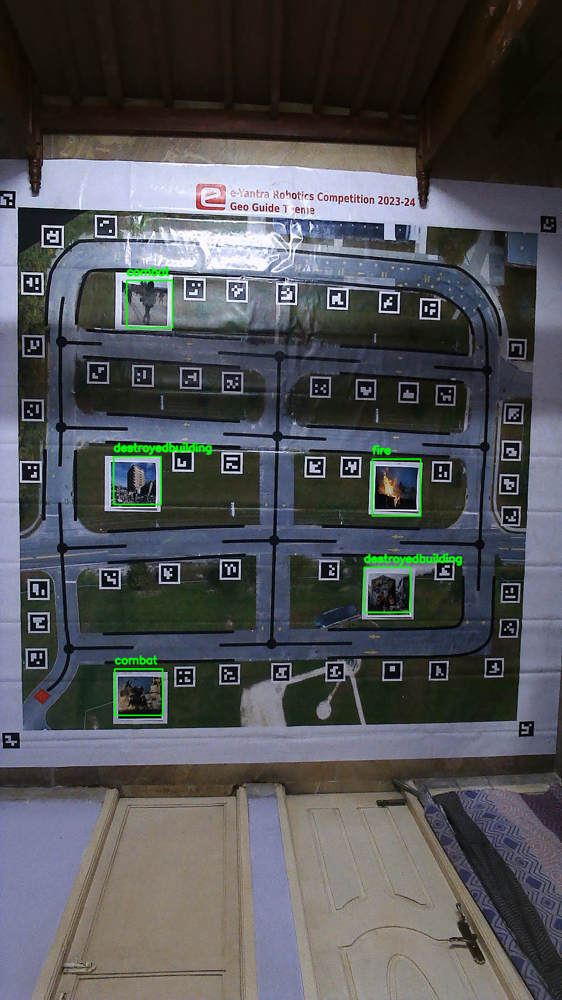

FileNotFoundError: [Errno 2] No such file or directory: 'arena.png'

In [ ]:
# @title bbox,classify,text,nolive
from sys import platform
import numpy as np
import subprocess
import cv2 as cv       # OpenCV Library
import shutil
import ast
import sys
import os
from cv2 import aruco
import cv2
from google.colab.patches import cv2_imshow

from tensorflow.keras.models import load_model
from PIL import Image
import cv2
from tensorflow import keras
from tensorflow.keras.preprocessing import image

arena_path = "testd1.jpg"            # Path of generated arena image
event_list = []
detected_list = []

combat = "combat"
rehab = "humanitarianaid"
military_vehicles = "militaryvehicles"
fire = "fire"
destroyed_building = "destroyedbuilding"

def arena_image(arena_path):
  frame = cv.imread(arena_path)
  #arena = cv.resize(frame, (700,700))
  arena = frame
  return arena


def event_identification(arena):
      bboxes = []
      def process_image1(image_path, marker_dict, param_markers, target_marker_id, min_area, max_area, scale_factor_width, scale_factor_height, align_width_to_left=True, extra_distance=2):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
            gray_frame, marker_dict, parameters=param_markers
            )

            # Initialize marker_corners as an empty list
            marker_corners_list = []

            # Check if any markers are found
            if marker_corners:
                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID
                    if ids[0] == target_marker_id:
                        marker_corners_list.append(corners)

                # Check if the ArUco marker is found
                if marker_corners_list:
                    # Combine corners of all markers to get the common region
                    common_region = np.concatenate(marker_corners_list, axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor
                    new_w = int(w * scale_factor_width1)

                    # Adjust the x-coordinate based on the alignment option and extra distance
                    if align_width_to_left1:
                        new_x = x - extra_distance1 - (new_w - w)  # Align to the left side with extra distance
                    else:
                        new_x = x  # Align to the right side without extra distance

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height1)

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, y), (new_x + new_w, y + new_h), (255, 0, 0), 2)

                    # Crop the region based on the modified bounding box
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area1 <= cv.contourArea(cnt) <= max_area1
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,y,new_x+new_w,y+new_h

                '''cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()'''

      def process_image2(image_path, marker_dict, param_markers, target_marker_id, min_area, max_area, scale_factor_width, scale_factor_height, align_width_to_left=True,align_width_to_top=True, extra_distance=2):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            # Initialize marker_corners as an empty list
            marker_corners_list = []

            # Check if any markers are found
            if marker_corners:
                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID
                    if ids[0] == target_marker_id:
                        marker_corners_list.append(corners)

                # Check if the ArUco marker is found
                if marker_corners_list:
                    # Combine corners of all markers to get the common region
                    common_region = np.concatenate(marker_corners_list, axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor
                    new_w = int(w * scale_factor_width2)

                    # Adjust the x-coordinate based on the alignment option and extra distance
                    if align_width_to_left2:
                        new_x = x - extra_distance2 - (new_w - w)  # Align to the left side with extra distance
                    else:
                        new_x = x  # Align to the right side without extra distance

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height2)

                    if align_width_to_top2:
                        new_y = y - 52 + (new_h - h)   # Align to the left side with extra distance
                    else:
                        new_y = y  # Align to the right side without extra distance

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, new_y), (new_x + new_w, new_y + new_h), (255, 0, 0), 2)

                    # Crop the region based on the modified bounding box
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area2 <= cv.contourArea(cnt) <= max_area2
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,new_y,new_x + new_w,new_y + new_h

                '''cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()'''

      def process_image3(image_path, marker_dict, param_markers, target_marker_id_1, target_marker_id_2, min_area, max_area, scale_factor_width, scale_factor_height):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            if marker_corners:
                # Lists to store corners of the specified ArUco markers
                corners_1 = None
                corners_2 = None

                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID 1
                    if ids[0] == target_marker_id_31:
                        corners_1 = corners

                    # Check if the current marker ID matches the target ID 2
                    elif ids[0] == target_marker_id_32:
                        corners_2 = corners

                # Check if both ArUco markers are found
                if corners_1 is not None and corners_2 is not None:
                    # Combine corners of both markers to get the common region
                    common_region = np.concatenate((corners_1, corners_2), axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    #cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor from the center
                    new_w = int(w * scale_factor_width3)

                    # Adjust the x-coordinate to keep the center of the bounding box fixed
                    new_x = int(x + (w - new_w) / 2)

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height3)

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, y), (new_x + new_w, y + new_h), (255, 0, 0), 2)

                    # Crop the common region
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area3 <= cv.contourArea(cnt) <= max_area3
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,y,new_x+new_w,y+new_h

                '''cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()'''

      def process_image4(image_path, marker_dict, param_markers, target_marker_id_1, target_marker_id_2, min_area, max_area, scale_factor_width, scale_factor_height):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            if marker_corners:
                # Lists to store corners of the specified ArUco markers
                corners_1 = None
                corners_2 = None

                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID 1
                    if ids[0] == target_marker_id_41:
                        corners_1 = corners

                    # Check if the current marker ID matches the target ID 2
                    elif ids[0] == target_marker_id_42:
                        corners_2 = corners

                # Check if both ArUco markers are found
                if corners_1 is not None and corners_2 is not None:
                    # Combine corners of both markers to get the common region
                    common_region = np.concatenate((corners_1, corners_2), axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    #cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor from the center
                    new_w = int(w * scale_factor_width4)

                    # Adjust the x-coordinate to keep the center of the bounding box fixed
                    new_x = int(x + (w - new_w) / 2)

                    # Calculate the new height based on scaling factor from the top side
                    extra_distance = 10  # Set the extra distance from the top side
                    new_h = int(h * scale_factor_height4)
                    new_y = y + extra_distance  # Adjust the y-coordinate to align with the top side

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, new_y), (new_x + new_w, new_y + new_h), (255, 0, 0), 2)

                    # Crop the common region
                    roi = frame[new_y:new_y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area4 <= cv.contourArea(cnt) <= max_area4
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,new_y,new_x + new_w,new_y + new_h

                '''cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()'''

      def process_image5(image_path, marker_dict, param_markers, target_marker_id, min_area, max_area, scale_factor_width, scale_factor_height, align_width_to_left=True, extra_distance=2):
            frame = cv.imread(image_path)
            gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

            marker_corners, marker_IDs, reject = aruco.detectMarkers(
                gray_frame, marker_dict, parameters=param_markers
            )

            # Initialize marker_corners as an empty list
            marker_corners_list = []

            # Check if any markers are found
            if marker_corners:
                for ids, corners in zip(marker_IDs, marker_corners):
                    cv.polylines(
                        frame, [corners.astype(np.int32)], True, (0, 255, 255), 4, cv.LINE_AA
                    )
                    corners = corners.reshape(4, 2)
                    corners = corners.astype(int)

                    # Check if the current marker ID matches the target ID
                    if ids[0] == target_marker_id:
                        marker_corners_list.append(corners)

                # Check if the ArUco marker is found
                if marker_corners_list:
                    # Combine corners of all markers to get the common region
                    common_region = np.concatenate(marker_corners_list, axis=0)

                    # Detect and draw the original bounding box around the common region
                    x, y, w, h = cv.boundingRect(common_region.astype(np.int32))
                    cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

                    # Calculate the new width based on scaling factor
                    new_w = int(w * scale_factor_width5)

                    # Adjust the x-coordinate based on the alignment option and extra distance
                    if align_width_to_left5:
                        new_x = x - extra_distance5 - (new_w - w)  # Align to the left side with extra distance
                    else:
                        new_x = x  # Align to the right side without extra distance

                    # Calculate the new height based on scaling factor from the top side
                    new_h = int(h * scale_factor_height5)

                    # Draw the modified bounding box
                    cv.rectangle(frame, (new_x, y), (new_x + new_w, y + new_h), (255, 0, 0), 2)

                    #print("x,y,w,h")
                    #print(new_x, y, new_x+new_w, y+new_h)

                    # Crop the region based on the modified bounding box
                    roi = frame[y:y+new_h, new_x:new_x+new_w]

                    # Convert the ROI to grayscale
                    gray_roi = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)

                    # Threshold the grayscale image to obtain a binary mask of the white color
                    _, white_mask = cv.threshold(gray_roi, 200, 255, cv.THRESH_BINARY)

                    # Find contours in the white mask
                    contours, _ = cv.findContours(white_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

                    # Filter contours based on area
                    valid_contours = [
                        cnt for cnt in contours if min_area5 <= cv.contourArea(cnt) <= max_area5
                    ]

                    # Draw the valid contours on the original frame in red color
                    cv.drawContours(frame, valid_contours, -1, (0, 0, 255), 2)

                    return roi,new_x,y,new_x + new_w,y + new_h

                '''cv2_imshow(frame)
                cv.waitKey(0)
                cv.destroyAllWindows()'''

      marker_dict = cv.aruco.getPredefinedDictionary(aruco.DICT_4X4_100)
      param_markers = aruco.DetectorParameters()

      image_path = 'testd1.jpg'

      target_marker_id_1 = 48  # Set the desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area1 = 3000  # Set the minimum area threshold for the white box
      max_area1 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width1 = 2.6  # Set the scaling factor for the width of the bounding box
      scale_factor_height1 = 2.6  # Set the scaling factor for the height of the bounding box (from top)
      align_width_to_left1 = True  # Set to True if you want to align the width to the left side
      extra_distance1 = 60  # Set the extra distance for alignment

      target_marker_id_2 = 34  # Set the desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area2 = 3000  # Set the minimum area threshold for the white box
      max_area2 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width2 = 2.7  # Set the scaling factor for the width of the bounding box
      scale_factor_height2 = 2.8  # Set the scaling factor for the height of the bounding box (from top)
      align_width_to_left2 = True  # Set to True if you want to align the width to the left side
      align_width_to_top2 = True
      extra_distance2 = 60  # Set the extra distance for alignment

      target_marker_id_31 = 31  # Set the first desired ArUco marker ID
      target_marker_id_32 = 30  # Set the second desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area3 = 3000  # Set the minimum area threshold for the white box
      max_area3 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width3 = 0.45  # Set the scaling factor for the width of the bounding box (from center)
      scale_factor_height3 = 2.67

      target_marker_id_41 = 28  # Set the first desired ArUco marker ID
      target_marker_id_42 = 29  # Set the second desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area4 = 3000  # Set the minimum area threshold for the white box
      max_area4 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width4 = 0.35  # Set the scaling factor for the width of the bounding box (from center)
      scale_factor_height4 = 2.7

      target_marker_id_5 = 21  # Set the desired ArUco marker ID

      # #23,21  28,29  31,30  49,34  52,48
      min_area5 = 3000  # Set the minimum area threshold for the white box
      max_area5 = 5000  # Set the maximum area threshold for the white box
      scale_factor_width5 = 2.8  # Set the scaling factor for the width of the bounding box
      scale_factor_height5 = 2.8  # Set the scaling factor for the height of the bounding box (from top)
      align_width_to_left5 = True  # Set to True if you want to align the width to the left side
      extra_distance5 = 60

      r1 = (process_image1(image_path, marker_dict, param_markers, target_marker_id_1, min_area1, max_area1, scale_factor_width1, scale_factor_height1, align_width_to_left1, extra_distance1))
      r2 = (process_image2(image_path, marker_dict, param_markers, target_marker_id_2, min_area2, max_area2, scale_factor_width2, scale_factor_height2, align_width_to_left2, align_width_to_top2, extra_distance2))
      r3 = (process_image3(image_path, marker_dict, param_markers, target_marker_id_31, target_marker_id_32, min_area3, max_area3, scale_factor_width3, scale_factor_height3))
      r4 = (process_image4(image_path, marker_dict, param_markers, target_marker_id_41, target_marker_id_42, min_area4, max_area4, scale_factor_width4, scale_factor_height4))
      r5 = (process_image5(image_path, marker_dict, param_markers, target_marker_id_5, min_area5, max_area5, scale_factor_width5, scale_factor_height5, align_width_to_left5, extra_distance5))

      if r1 is not None:
        bboxes.append(r1[0])
      if r2 is not None:
        bboxes.append(r2[0])
      if r3 is not None:
        bboxes.append(r3[0])
      if r4 is not None:
        bboxes.append(r4[0])
      if r5 is not None:
        bboxes.append(r5[0])

      evlist = []

      if r1 is not None:
        evlist.append(r1[1:])
      if r2 is not None:
        evlist.append(r2[1:])
      if r3 is not None:
        evlist.append(r3[1:])
      if r4 is not None:
        evlist.append(r4[1:])
      if r5 is not None:
        evlist.append(r5[1:])


      '''evlist.append(process_image1(image_path, marker_dict, param_markers, target_marker_id_1, min_area1, max_area1, scale_factor_width1, scale_factor_height1, align_width_to_left1, extra_distance1))[0]
      evlist.append(process_image2(image_path, marker_dict, param_markers, target_marker_id_2, min_area2, max_area2, scale_factor_width2, scale_factor_height2, align_width_to_left2, align_width_to_top2, extra_distance2))[0]
      evlist.append(process_image3(image_path, marker_dict, param_markers, target_marker_id_31, target_marker_id_32, min_area3, max_area3, scale_factor_width3, scale_factor_height3))[0]
      evlist.append(process_image4(image_path, marker_dict, param_markers, target_marker_id_41, target_marker_id_42, min_area4, max_area4, scale_factor_width4, scale_factor_height4))[0]
      evlist.append(process_image5(image_path, marker_dict, param_markers, target_marker_id_5, min_area5, max_area5, scale_factor_width5, scale_factor_height5, align_width_to_left5, extra_distance5))[0]
      '''

      #print(type(bboxes))
      '''for i in bboxes:
        print(type(i))
        #print(i)
        cv2_imshow(i)'''
      event_list = bboxes
      '''for i in evlist:
        print("EVent list")
        print(i)'''

      return event_list,evlist


def classify_event(image_path):
    from cv2 import dnn_superres

    # Create an SR object
    sr = dnn_superres.DnnSuperResImpl_create()

    # Read image
    image = image_path
    image = np.array(image)

    # Read the desired model
    path = "/content/drive/MyDrive/EDSR_x3.pb"
    sr.readModel(path)

    # Set the desired model and scale to get correct pre- and post-processing
    sr.setModel("edsr", 3)

    # Upscale the image
    result = sr.upsample(image)

    #cv2_imshow(result)





    model = keras.models.load_model('/content/drive/MyDrive/modelsaltpepnogenerator.h5')
    # img_path = image
    # img = image.load_img(img_path, target_size=(height, width))  # height and width should match your model's input shape
    #img = image_path
    img = result
    #img_array = cv2.imread(img)
    img_array = np.array(img)
    resized_image = cv2.resize(img_array, (224, 224))
    img_array = np.expand_dims(resized_image, axis=0)

    print(img_array.shape)
    img_array = img_array / 255.0  # Normalize the pixel values
    #print(img_array)

    predictions = model.predict(img_array)
    predicted_label = np.argmax(predictions)
    a = [combat, destroyed_building, fire, rehab, military_vehicles]
    b = a[predicted_label]
    event = b

    return event
def draw_text(image, text, x, y):
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.7
    font_thickness = 2
    color = (0, 255, 0)
    cv2.putText(image, text, (x, y - 10), font, font_scale, color, font_thickness, cv2.LINE_AA)

def classification(event_list,evlist):
    arena = cv.imread(arena_path)
    for img_index in range(0,5):
        img = event_list[img_index]
        #print("img")
        #print(type(img))
        detected_event = classify_event(img)
        print((img_index + 1), detected_event)
        if detected_event == combat:
            detected_list.append("combat")
        if detected_event == rehab:
            detected_list.append("rehab")
        if detected_event == military_vehicles:
            detected_list.append("militaryvehicles")
        if detected_event == fire:
            detected_list.append("fire")
        if detected_event == destroyed_building:
            detected_list.append("destroyedbuilding")

        for bbox, event_text in zip(evlist, detected_list):
            x, y, w, h = bbox
            #print('bbox',x,y,w,h)
            cv2.rectangle(arena, (x, y), (w, h), (0, 255, 0), 2)
            draw_text(arena, event_text, x, y)
        #print("text in image")
    cv2_imshow(arena)
    os.remove('arena.png')
    return detected_list

def detected_list_processing(detected_list):
    try:
        detected_events = open("detected_events.txt", "w")
        detected_events.writelines(str(detected_list))
    except Exception as e:
        print("Error: ", e)

def input_function():
    if platform == "win32":
        try:
            subprocess.run("input.exe")
        except Exception as e:
            print("Error: ", e)
    if platform == "linux":
        try:
            subprocess.run("./input")
        except Exception as e:
            print("Error: ", e)

def output_function():
    if platform == "win32":
        try:
            subprocess.run("output.exe")
        except Exception as e:
            print("Error: ", e)
    if platform == "linux":
        try:
            subprocess.run("./output")
        except Exception as e:
            print("Error: ", e)

###################################################################################################
def main():
    ##### Input #####
    input_function()
    #################

    ##### Process #####
    arena = arena_image(arena_path)
    event_list, evlist = event_identification(arena)
    detected_list = classification(event_list,evlist)
    detected_list_processing(detected_list)
    ###################

    ##### Output #####
    output_function()
    ##################

if __name__ == '__main__':
    try:
        main()
    except KeyboardInterrupt:
        print('Interrupted')
        if os.path.exists('arena.png'):
            os.remove('arena.png')
        if os.path.exists('detected_events.txt'):
            os.remove('detected_events.txt')
        sys.exit()